# Product Category Preference Prediction


### Reg No: IT21126888
### Name: Senadheera P.V.P.P

<hr/>

<ul>
    <li><b>Target Variable:</b> Category (Office Supplies, Furniture, Technology)</li>
    <li><b>Predictors:</b> Ship Mode, Segment, State, Country, Market, Region, Sales, Quantity, Discount, Shipping Cost and Orderriority</li>
    <li><b>Objective:</b> Predict the likely product category preferences of customers based on their purchase patterns, assisting in inventory management and marketing strategies.</li>
</ul>




In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report

Importing Dataset

In [2]:
dataset = pd.read_csv('../dataset/SuperStoreOrders.csv')
dataset

,order_id,order_date,ship_date,ship_mode,customer_name,segment,state,country,market,region,...,category,sub_category,product_name,sales,quantity,discount,profit,shipping_cost,order_priority,year
0,AG-2011-2040,1/1/2011,6/1/2011,Standard Class,Toby Braunhardt,Consumer,Constantine,Algeria,Africa,Africa,...,Office Supplies,Storage,"Tenex Lockers, Blue",408,2,0.0,106.1400,35.46,Medium,2011
1,IN-2011-47883,1/1/2011,8/1/2011,Standard Class,Joseph Holt,Consumer,New South Wales,Australia,APAC,Oceania,...,Office Supplies,Supplies,"Acme Trimmer, High Speed",120,3,0.1,36.0360,9.72,Medium,2011
2,HU-2011-1220,1/1/2011,5/1/2011,Second Class,Annie Thurman,Consumer,Budapest,Hungary,EMEA,EMEA,...,Office Supplies,Storage,"Tenex Box, Single Width",66,4,0.0,29.6400,8.17,High,2011
3,IT-2011-3647632,1/1/2011,5/1/2011,Second Class,Eugene Moren,Home Office,Stockholm,Sweden,EU,North,...,Office Supplies,Paper,"Enermax Note Cards, Premium",45,3,0.5,-26.0550,4.82,High,2011
4,IN-2011-47883,1/1/2011,8/1/2011,Standard Class,Joseph Holt,Consumer,New South Wales,Australia,APAC,Oceania,...,Furniture,Furnishings,"Eldon Light Bulb, Duo Pack",114,5,0.1,37.7700,4.70,Medium,2011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51285,CA-2014-115427,31-12-2014,4/1/2015,Standard Class,Erica Bern,Corporate,California,United States,US,West,...,Office Supplies,Binders,"Cardinal Slant-D Ring Binder, Heavy Gauge Vinyl",14,2,0.2,4.5188,0.89,Medium,2014
51286,MO-2014-2560,31-12-2014,5/1/2015,Standard Class,Liz Preis,Consumer,Souss-Massa-Draâ,Morocco,Africa,Africa,...,Office Supplies,Binders,"Wilson Jones Hole Reinforcements, Clear",4,1,0.0,0.4200,0.49,Medium,2014
51287,MX-2014-110527,31-12-2014,2/1/2015,Second Class,Charlotte Melton,Consumer,Managua,Nicaragua,LATAM,Central,...,Office Supplies,Labels,"Hon Color Coded Labels, 5000 Label Set",26,3,0.0,12.3600,0.35,Medium,2014
51288,MX-2014-114783,31-12-2014,6/1/2015,Standard Class,Tamara Dahlen,Consumer,Chihuahua,Mexico,LATAM,North,...,Office Supplies,Labels,"Hon Legal Exhibit Labels, Alphabetical",7,1,0.0,0.5600,0.20,Medium,2014


Data Pre-processing

In [3]:
dataset = dataset[['ship_mode', 'segment', 'state', 'country', 'market', 'region', 'sales', 'quantity', 'discount', 'shipping_cost', 'order_priority', 'category']]
dataset

,ship_mode,segment,state,country,market,region,sales,quantity,discount,shipping_cost,order_priority,category
0,Standard Class,Consumer,Constantine,Algeria,Africa,Africa,408,2,0.0,35.46,Medium,Office Supplies
1,Standard Class,Consumer,New South Wales,Australia,APAC,Oceania,120,3,0.1,9.72,Medium,Office Supplies
2,Second Class,Consumer,Budapest,Hungary,EMEA,EMEA,66,4,0.0,8.17,High,Office Supplies
3,Second Class,Home Office,Stockholm,Sweden,EU,North,45,3,0.5,4.82,High,Office Supplies
4,Standard Class,Consumer,New South Wales,Australia,APAC,Oceania,114,5,0.1,4.70,Medium,Furniture
...,...,...,...,...,...,...,...,...,...,...,...,...
51285,Standard Class,Corporate,California,United States,US,West,14,2,0.2,0.89,Medium,Office Supplies
51286,Standard Class,Consumer,Souss-Massa-Draâ,Morocco,Africa,Africa,4,1,0.0,0.49,Medium,Office Supplies
51287,Second Class,Consumer,Managua,Nicaragua,LATAM,Central,26,3,0.0,0.35,Medium,Office Supplies
51288,Standard Class,Consumer,Chihuahua,Mexico,LATAM,North,7,1,0.0,0.20,Medium,Office Supplies


Dataset doesn't have any null value.


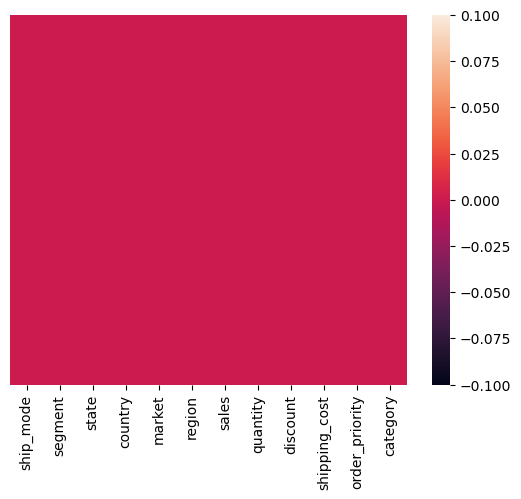

In [4]:
# Checking for missing values
sns.heatmap(dataset.isnull(),yticklabels=False)

hasNullValues = dataset.isnull().values.any()
if(hasNullValues == False):
    print("Dataset doesn't have any null value.")
else:
    print("Dataset has null values.")
    nullCount = dataset.isnull().sum().sum()
    print("Number of null values:", nullCount)

In [5]:
# Checking the columns in dataframe
dataset.columns

Index(['ship_mode', 'segment', 'state', 'country', 'market', 'region', 'sales',
       'quantity', 'discount', 'shipping_cost', 'order_priority', 'category'],
      dtype='object')

In [6]:
# Checking the unique values
print("ship_mode:", dataset.ship_mode.unique())
print("no of ship_mode:", dataset.ship_mode.nunique())

print("segment:", dataset.segment.unique())
print("no of segment:", dataset.segment.nunique())

print("state:", dataset.state.unique())
print("no of state:", dataset.state.nunique())

print("country:", dataset.country.unique())
print("no of country:", dataset.country.nunique())

print("market:", dataset.market.unique())
print("no of market:", dataset.market.nunique())

print("region:", dataset.region.unique())
print("no of region:", dataset.region.nunique())

print("order_priority:", dataset.order_priority.unique())
print("no of order_priority:", dataset.order_priority.nunique())

print("category:", dataset.category.unique())
print("no of category:", dataset.category.nunique())

ship_mode: ['Standard Class' 'Second Class' 'Same Day' 'First Class']
no of ship_mode: 4
segment: ['Consumer' 'Home Office' 'Corporate']
no of segment: 3
state: ['Constantine' 'New South Wales' 'Budapest' ... 'Karaman' 'Sikasso'
 'Atsimo-Andrefana']
no of state: 1094
country: ['Algeria' 'Australia' 'Hungary' 'Sweden' 'Canada' 'New Zealand' 'Iraq'
 'Philippines' 'United Kingdom' 'Malaysia' 'Guatemala' 'Iran' 'Thailand'
 'Tanzania' 'Brazil' 'Mexico' 'Cuba' 'France' 'United States' 'Japan'
 'Sudan' 'Taiwan' 'Indonesia' 'Vietnam' 'Angola' 'China' 'Mozambique'
 'Lebanon' 'Singapore' 'Netherlands' 'Nigeria' 'Egypt' 'Venezuela'
 'South Africa' 'Spain' 'India' 'Turkey' 'Austria' 'Italy' 'Germany'
 'Nicaragua' 'Dominican Republic' 'El Salvador' 'Denmark' 'Saudi Arabia'
 'Zambia' 'Myanmar (Burma)' 'Russia' 'Mongolia' 'Belgium' 'Kenya'
 'Colombia' 'Estonia' 'Madagascar' 'Portugal' 'Morocco' 'Sierra Leone'
 'Norway' 'Central African Republic' 'Czech Republic' 'Benin' 'Bangladesh'
 'Panama' 'Chile'

In [7]:
# Label Encoding
labelEncoder = LabelEncoder()
dataset['ship_mode'] = labelEncoder.fit_transform(dataset['ship_mode'])
dataset['segment'] = labelEncoder.fit_transform(dataset['segment'])
dataset['state'] = labelEncoder.fit_transform(dataset['state'])
dataset['country'] = labelEncoder.fit_transform(dataset['country'])
dataset['market'] = labelEncoder.fit_transform(dataset['market'])
dataset['region'] = labelEncoder.fit_transform(dataset['region'])
dataset['order_priority'] = labelEncoder.fit_transform(dataset['order_priority'])
dataset['category'] = labelEncoder.fit_transform(dataset['category'])
dataset

C:\Users\poorn\AppData\Local\Temp\ipykernel_15032\1102244022.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['ship_mode'] = labelEncoder.fit_transform(dataset['ship_mode'])
C:\Users\poorn\AppData\Local\Temp\ipykernel_15032\1102244022.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['segment'] = labelEncoder.fit_transform(dataset['segment'])
C:\Users\poorn\AppData\Local\Temp\ipykernel_15032\1102244022.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from 

,ship_mode,segment,state,country,market,region,sales,quantity,discount,shipping_cost,order_priority,category
0,3,0,255,2,1,0,408,2,0.0,35.46,3,1
1,3,0,702,6,0,9,120,3,0.1,9.72,3,1
2,2,0,175,56,3,5,66,4,0.0,8.17,1,1
3,2,2,939,123,4,7,45,3,0.5,4.82,1,1
4,3,0,702,6,0,9,114,5,0.1,4.70,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...
51285,3,1,192,139,6,12,14,2,0.2,0.89,3,1
51286,3,0,923,85,1,0,4,1,0.0,0.49,3,1
51287,2,0,599,92,5,3,26,3,0.0,0.35,3,1
51288,3,0,230,81,5,7,7,1,0.0,0.20,3,1


In [8]:
dataset['sales'] = dataset['sales'].str.replace(',', '').astype(float)

C:\Users\poorn\AppData\Local\Temp\ipykernel_15032\81960916.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['sales'] = dataset['sales'].str.replace(',', '').astype(float)


In [9]:
dataset.describe()

,ship_mode,segment,state,country,market,region,sales,quantity,discount,shipping_cost,order_priority,category
count,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000
mean,2.254709,0.665139,561.391499,79.073738,3.351063,6.052388,246.498440,3.476545,0.142908,26.375915,2.118308,1.005167
std,1.083110,0.766199,304.130849,46.684209,2.219025,3.587991,487.567175,2.278766,0.212280,57.296804,1.081088,0.624701
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,0.000000,311.000000,44.000000,1.000000,3.000000,31.000000,2.000000,0.000000,2.610000,1.000000,1.000000
50%,3.000000,0.000000,572.000000,81.000000,4.000000,6.000000,85.000000,3.000000,0.000000,7.790000,3.000000,1.000000
75%,3.000000,1.000000,820.000000,134.000000,5.000000,10.000000,251.000000,5.000000,0.200000,24.450000,3.000000,1.000000
max,3.000000,2.000000,1093.000000,146.000000,6.000000,12.000000,22638.000000,14.000000,0.850000,933.570000,3.000000,2.000000


In [10]:
# Normalization
def min_max_normalize(data):
    min_val = np.min(data)
    max_val = np.max(data)
    data_norm = (data - min_val) / (max_val - min_val)
    return data_norm

In [11]:
dataset['sales'] = min_max_normalize(dataset['sales'])
dataset['shipping_cost'] = min_max_normalize(dataset['shipping_cost'])
dataset

C:\Users\poorn\AppData\Local\Temp\ipykernel_15032\3738508449.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['sales'] = min_max_normalize(dataset['sales'])
C:\Users\poorn\AppData\Local\Temp\ipykernel_15032\3738508449.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['shipping_cost'] = min_max_normalize(dataset['shipping_cost'])


,ship_mode,segment,state,country,market,region,sales,quantity,discount,shipping_cost,order_priority,category
0,3,0,255,2,1,0,0.018023,2,0.0,0.037983,3,1
1,3,0,702,6,0,9,0.005301,3,0.1,0.010412,3,1
2,2,0,175,56,3,5,0.002915,4,0.0,0.008751,1,1
3,2,2,939,123,4,7,0.001988,3,0.5,0.005163,1,1
4,3,0,702,6,0,9,0.005036,5,0.1,0.005034,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...
51285,3,1,192,139,6,12,0.000618,2,0.2,0.000953,3,1
51286,3,0,923,85,1,0,0.000177,1,0.0,0.000525,3,1
51287,2,0,599,92,5,3,0.001149,3,0.0,0.000375,3,1
51288,3,0,230,81,5,7,0.000309,1,0.0,0.000214,3,1


In [12]:
# Dividing X and Y sets
Y = dataset['category']
X = dataset.drop(['category'], axis=1)

In [13]:
# Visualizing X and Y sets
print(X)
print(Y)

       ship_mode  segment  state  country  market  region     sales  quantity  \
0              3        0    255        2       1       0  0.018023         2   
1              3        0    702        6       0       9  0.005301         3   
2              2        0    175       56       3       5  0.002915         4   
3              2        2    939      123       4       7  0.001988         3   
4              3        0    702        6       0       9  0.005036         5   
...          ...      ...    ...      ...     ...     ...       ...       ...   
51285          3        1    192      139       6      12  0.000618         2   
51286          3        0    923       85       1       0  0.000177         1   
51287          2        0    599       92       5       3  0.001149         3   
51288          3        0    230       81       5       7  0.000309         1   
51289          3        0    251      139       6      12  0.000133         3   

       discount  shipping_c

In [14]:
# Splitting train and test sets
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=22)

Hyper Parameter tuning

In [15]:
# Classifiers
logisticRegression = LogisticRegression(max_iter=400)
decisionTreeClassifier = DecisionTreeClassifier()
ridgeClassifier = RidgeClassifier()
baggingClassifier = BaggingClassifier()
randomForestClassifier = RandomForestClassifier()
svc = SVC()
kneighborsClassifier = KNeighborsClassifier()
gradientBoostingClassifier = GradientBoostingClassifier()

In [17]:
# Hyper Parameter tuning
# LogisticRegression
parametersLogisticRegression={"solver":["newton-cg","lbfgs","liblinear","newton-cholesky","sag","saga"],
                              "penalty":['l2'],
                              "C":[100,10,1.0,0.1,0.01] }

tuningLogisticRegression=GridSearchCV(logisticRegression,param_grid=parametersLogisticRegression,scoring='accuracy',cv=3,verbose=3)
tuningLogisticRegression.fit(x_train, y_train)

print("Best Hyperparameters")
print("LogisticRegression", tuningLogisticRegression.best_params_, tuningLogisticRegression.best_score_)

Fitting 3 folds for each of 30 candidates, totalling 90 fits
[CV 1/3] END C=100, penalty=l2, solver=newton-cg;, score=0.154 total time=   0.0s
[CV 2/3] END C=100, penalty=l2, solver=newton-cg;, score=0.193 total time=   0.0s
[CV 3/3] END C=100, penalty=l2, solver=newton-cg;, score=0.159 total time=   0.0s
[CV 1/3] END ...C=100, penalty=l2, solver=lbfgs;, score=0.154 total time=   0.0s
[CV 2/3] END ...C=100, penalty=l2, solver=lbfgs;, score=0.193 total time=   0.0s
[CV 3/3] END ...C=100, penalty=l2, solver=lbfgs;, score=0.159 total time=   0.0s
[CV 1/3] END C=100, penalty=l2, solver=liblinear;, score=0.158 total time=   0.0s
[CV 2/3] END C=100, penalty=l2, solver=liblinear;, score=0.193 total time=   0.0s
[CV 3/3] END C=100, penalty=l2, solver=liblinear;, score=0.163 total time=   0.0s
[CV 1/3] END C=100, penalty=l2, solver=newton-cholesky;, score=0.158 total time=   0.0s
[CV 2/3] END C=100, penalty=l2, solver=newton-cholesky;, score=0.193 total time=   0.0s
[CV 3/3] END C=100, penalty=

C:\Poorna\Software\Anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Poorna\Software\Anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Poorna\Software\Anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV 2/3] END ....C=100, penalty=l2, solver=saga;, score=0.193 total time=   0.0s
[CV 3/3] END ....C=100, penalty=l2, solver=saga;, score=0.163 total time=   0.0s
[CV 1/3] END C=10, penalty=l2, solver=newton-cg;, score=0.158 total time=   0.0s
[CV 2/3] END C=10, penalty=l2, solver=newton-cg;, score=0.193 total time=   0.0s
[CV 3/3] END C=10, penalty=l2, solver=newton-cg;, score=0.167 total time=   0.0s
[CV 1/3] END ....C=10, penalty=l2, solver=lbfgs;, score=0.158 total time=   0.0s
[CV 2/3] END ....C=10, penalty=l2, solver=lbfgs;, score=0.189 total time=   0.0s
[CV 3/3] END ....C=10, penalty=l2, solver=lbfgs;, score=0.167 total time=   0.0s
[CV 1/3] END C=10, penalty=l2, solver=liblinear;, score=0.154 total time=   0.0s
[CV 2/3] END C=10, penalty=l2, solver=liblinear;, score=0.189 total time=   0.0s
[CV 3/3] END C=10, penalty=l2, solver=liblinear;, score=0.163 total time=   0.0s
[CV 1/3] END C=10, penalty=l2, solver=newton-cholesky;, score=0.158 total time=   0.0s
[CV 2/3] END C=10, pen

C:\Poorna\Software\Anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Poorna\Software\Anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Poorna\Software\Anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV 1/3] END .....C=10, penalty=l2, solver=saga;, score=0.162 total time=   0.0s
[CV 2/3] END .....C=10, penalty=l2, solver=saga;, score=0.193 total time=   0.0s
[CV 3/3] END .....C=10, penalty=l2, solver=saga;, score=0.163 total time=   0.0s
[CV 1/3] END C=1.0, penalty=l2, solver=newton-cg;, score=0.145 total time=   0.0s
[CV 2/3] END C=1.0, penalty=l2, solver=newton-cg;, score=0.180 total time=   0.0s
[CV 3/3] END C=1.0, penalty=l2, solver=newton-cg;, score=0.163 total time=   0.0s
[CV 1/3] END ...C=1.0, penalty=l2, solver=lbfgs;, score=0.145 total time=   0.0s
[CV 2/3] END ...C=1.0, penalty=l2, solver=lbfgs;, score=0.185 total time=   0.0s
[CV 3/3] END ...C=1.0, penalty=l2, solver=lbfgs;, score=0.163 total time=   0.0s
[CV 1/3] END C=1.0, penalty=l2, solver=liblinear;, score=0.141 total time=   0.0s
[CV 2/3] END C=1.0, penalty=l2, solver=liblinear;, score=0.180 total time=   0.0s
[CV 3/3] END C=1.0, penalty=l2, solver=liblinear;, score=0.167 total time=   0.0s
[CV 1/3] END C=1.0, pe

In [15]:
# Hyper Parameter tuning
# DecisionTreeClassifier
parametersDecisionTreeClassifier={"splitter":["best","random"],
                                 "max_depth" : [1,3,5,7,9,11,12],
                                 "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
                                 "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5],
                                 "max_features":["log2","sqrt",None],
                                 "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90] }

tuningDecisionTreeClassifier=GridSearchCV(decisionTreeClassifier,param_grid=parametersDecisionTreeClassifier,scoring='accuracy',cv=3,verbose=3)
tuningDecisionTreeClassifier.fit(x_train, y_train)

print("Best Hyperparameters")
print("DecisionTreeClassifier", tuningDecisionTreeClassifier.best_params_, tuningDecisionTreeClassifier.best_score_)

Fitting 3 folds for each of 21000 candidates, totalling 63000 fits
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=0.171 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=0.163 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=0.172 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=0.154 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=0.155 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1

In [16]:
# Hyper Parameter tuning
# RidgeClassifier
parametersRidgeClassifier={"alpha" : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0] }

tuningRidgeClassifier=GridSearchCV(ridgeClassifier,param_grid=parametersRidgeClassifier,scoring='accuracy',cv=3,verbose=3)
tuningRidgeClassifier.fit(x_train, y_train)

print("Best Hyperparameters")
print("RidgeClassifier", tuningRidgeClassifier.best_params_, tuningRidgeClassifier.best_score_)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV 1/3] END .........................alpha=0.1;, score=0.154 total time=   0.0s
[CV 2/3] END .........................alpha=0.1;, score=0.180 total time=   0.0s
[CV 3/3] END .........................alpha=0.1;, score=0.167 total time=   0.0s
[CV 1/3] END .........................alpha=0.2;, score=0.158 total time=   0.0s
[CV 2/3] END .........................alpha=0.2;, score=0.180 total time=   0.0s
[CV 3/3] END .........................alpha=0.2;, score=0.167 total time=   0.0s
[CV 1/3] END .........................alpha=0.3;, score=0.158 total time=   0.0s
[CV 2/3] END .........................alpha=0.3;, score=0.180 total time=   0.0s
[CV 3/3] END .........................alpha=0.3;, score=0.167 total time=   0.0s
[CV 1/3] END .........................alpha=0.4;, score=0.162 total time=   0.0s
[CV 2/3] END .........................alpha=0.4;, score=0.180 total time=   0.0s
[CV 3/3] END .........................alpha=0.4;

In [17]:
# Hyper Parameter tuning
# BaggingClassifier
parametersBaggingClassifier={"n_estimators" : [10, 100, 1000] }

tuningBaggingClassifier=GridSearchCV(baggingClassifier,param_grid=parametersBaggingClassifier,scoring='accuracy',cv=3,verbose=3)
tuningBaggingClassifier.fit(x_train, y_train)

print("Best Hyperparameters")
print("BaggingClassifier", tuningBaggingClassifier.best_params_, tuningBaggingClassifier.best_score_)

Fitting 3 folds for each of 3 candidates, totalling 9 fits
[CV 1/3] END ...................n_estimators=10;, score=0.171 total time=   0.0s
[CV 2/3] END ...................n_estimators=10;, score=0.150 total time=   0.0s
[CV 3/3] END ...................n_estimators=10;, score=0.167 total time=   0.0s
[CV 1/3] END ..................n_estimators=100;, score=0.188 total time=   0.2s
[CV 2/3] END ..................n_estimators=100;, score=0.197 total time=   0.2s
[CV 3/3] END ..................n_estimators=100;, score=0.150 total time=   0.2s
[CV 1/3] END .................n_estimators=1000;, score=0.188 total time=   2.6s
[CV 2/3] END .................n_estimators=1000;, score=0.193 total time=   2.4s
[CV 3/3] END .................n_estimators=1000;, score=0.167 total time=   2.6s
Best Hyperparameters
BaggingClassifier {'n_estimators': 1000} 0.18284973649780514


In [20]:
# Hyper Parameter tuning
# RandomForestClassifier
parametersRandomForestClassifier={"n_estimators" : [10, 100, 1000],
                                  "max_features" : ["sqrt", "log2"]}

tuningRandomForestClassifier=GridSearchCV(randomForestClassifier,param_grid=parametersRandomForestClassifier,scoring='accuracy',cv=3,verbose=3)
tuningRandomForestClassifier.fit(x_train, y_train)

print("Best Hyperparameters")
print("RandomForestClassifier", tuningRandomForestClassifier.best_params_, tuningRandomForestClassifier.best_score_)

Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV 1/3] END max_features=sqrt, n_estimators=10;, score=0.158 total time=   0.0s
[CV 2/3] END max_features=sqrt, n_estimators=10;, score=0.172 total time=   0.0s
[CV 3/3] END max_features=sqrt, n_estimators=10;, score=0.176 total time=   0.0s
[CV 1/3] END max_features=sqrt, n_estimators=100;, score=0.179 total time=   0.1s
[CV 2/3] END max_features=sqrt, n_estimators=100;, score=0.180 total time=   0.1s
[CV 3/3] END max_features=sqrt, n_estimators=100;, score=0.185 total time=   0.1s
[CV 1/3] END max_features=sqrt, n_estimators=1000;, score=0.179 total time=   1.6s
[CV 2/3] END max_features=sqrt, n_estimators=1000;, score=0.180 total time=   1.7s
[CV 3/3] END max_features=sqrt, n_estimators=1000;, score=0.176 total time=   1.7s
[CV 1/3] END max_features=log2, n_estimators=10;, score=0.175 total time=   0.0s
[CV 2/3] END max_features=log2, n_estimators=10;, score=0.176 total time=   0.0s
[CV 3/3] END max_features=log2, n_estima

In [21]:
# Hyper Parameter tuning
# Support Vector Classification (SVC)
parametersSVC={"kernel" : ["linear", "poly", "rbf", "sigmoid"],
               "C" : [50, 10, 1.0, 0.1, 0.01],
               "gamma" : ['scale'] }

tuningSVC=GridSearchCV(svc,param_grid=parametersSVC,scoring='accuracy',cv=3,verbose=3)
tuningSVC.fit(x_train, y_train)

print("Best Hyperparameters")
print("SVC", tuningSVC.best_params_, tuningSVC.best_score_)

Fitting 3 folds for each of 20 candidates, totalling 60 fits
[CV 1/3] END ..C=50, gamma=scale, kernel=linear;, score=0.158 total time=   0.2s
[CV 2/3] END ..C=50, gamma=scale, kernel=linear;, score=0.167 total time=   4.2s
[CV 3/3] END ..C=50, gamma=scale, kernel=linear;, score=0.150 total time=   1.6s
[CV 1/3] END ....C=50, gamma=scale, kernel=poly;, score=0.171 total time=   0.0s
[CV 2/3] END ....C=50, gamma=scale, kernel=poly;, score=0.215 total time=   0.0s
[CV 3/3] END ....C=50, gamma=scale, kernel=poly;, score=0.180 total time=   0.0s
[CV 1/3] END .....C=50, gamma=scale, kernel=rbf;, score=0.188 total time=   0.0s
[CV 2/3] END .....C=50, gamma=scale, kernel=rbf;, score=0.176 total time=   0.0s
[CV 3/3] END .....C=50, gamma=scale, kernel=rbf;, score=0.189 total time=   0.0s
[CV 1/3] END .C=50, gamma=scale, kernel=sigmoid;, score=0.167 total time=   0.0s
[CV 2/3] END .C=50, gamma=scale, kernel=sigmoid;, score=0.180 total time=   0.0s
[CV 3/3] END .C=50, gamma=scale, kernel=sigmoid;

In [22]:
# Hyper Parameter tuning
# KNeighborsClassifier
parametersKNeighborsClassifier={"n_neighbors" : [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
               "weights" : ["uniform", "distance"],
               "leaf_size" : [1, 5, 10, 20, 30, 40, 50, 100],
               "p" : [1, 2] }

tuningKNeighborsClassifier=GridSearchCV(kneighborsClassifier,param_grid=parametersKNeighborsClassifier,scoring='accuracy',cv=3,verbose=3)
tuningKNeighborsClassifier.fit(x_train, y_train)

print("Best Hyperparameters")
print("KNeighborsClassifier", tuningKNeighborsClassifier.best_params_, tuningKNeighborsClassifier.best_score_)

Fitting 3 folds for each of 320 candidates, totalling 960 fits
[CV 1/3] END leaf_size=1, n_neighbors=1, p=1, weights=uniform;, score=0.214 total time=   0.0s
[CV 2/3] END leaf_size=1, n_neighbors=1, p=1, weights=uniform;, score=0.159 total time=   0.0s
[CV 3/3] END leaf_size=1, n_neighbors=1, p=1, weights=uniform;, score=0.193 total time=   0.0s
[CV 1/3] END leaf_size=1, n_neighbors=1, p=1, weights=distance;, score=0.214 total time=   0.0s
[CV 2/3] END leaf_size=1, n_neighbors=1, p=1, weights=distance;, score=0.159 total time=   0.0s
[CV 3/3] END leaf_size=1, n_neighbors=1, p=1, weights=distance;, score=0.193 total time=   0.0s
[CV 1/3] END leaf_size=1, n_neighbors=1, p=2, weights=uniform;, score=0.214 total time=   0.0s
[CV 2/3] END leaf_size=1, n_neighbors=1, p=2, weights=uniform;, score=0.176 total time=   0.0s
[CV 3/3] END leaf_size=1, n_neighbors=1, p=2, weights=uniform;, score=0.197 total time=   0.0s
[CV 1/3] END leaf_size=1, n_neighbors=1, p=2, weights=distance;, score=0.214 to

In [23]:
# Hyper Parameter tuning
# GradientBoostingClassifier
parametersGradientBoostingClassifier={"learning_rate" : [0.0001],
                                      "n_estimators" : [100],
                                      "subsample" : [0.1, 0.5, 1.0],
                                      "min_samples_split" : [2] }

tuningGradientBoostingClassifier=GridSearchCV(gradientBoostingClassifier,param_grid=parametersGradientBoostingClassifier,scoring='accuracy',cv=3,verbose=3)
tuningGradientBoostingClassifier.fit(x_train, y_train)

print("Best Hyperparameters")
print("GradientBoostingClassifier", tuningGradientBoostingClassifier.best_params_, tuningGradientBoostingClassifier.best_score_)

Fitting 3 folds for each of 3 candidates, totalling 9 fits
[CV 1/3] END learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=0.1;, score=0.175 total time=   0.3s
[CV 2/3] END learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=0.1;, score=0.172 total time=   0.3s
[CV 3/3] END learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=0.1;, score=0.176 total time=   0.3s
[CV 1/3] END learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=0.5;, score=0.171 total time=   0.5s
[CV 2/3] END learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=0.5;, score=0.185 total time=   0.4s
[CV 3/3] END learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=0.5;, score=0.176 total time=   0.4s
[CV 1/3] END learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=1.0;, score=0.171 total time=   0.5s
[CV 2/3] END learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=1.0;, scor

<b>Model Training and Evaluation</b>

In [18]:
# Classifiers
logisticRegression = LogisticRegression(C=0.01, penalty='l2', solver='newton-cg', max_iter=400)
decisionTreeClassifier = DecisionTreeClassifier(max_depth=5, max_features='log2', max_leaf_nodes=60, min_samples_leaf=8, 
                                                min_weight_fraction_leaf=0.1, splitter='random')
ridgeClassifier = RidgeClassifier(alpha=0.4)
baggingClassifier = BaggingClassifier(n_estimators=1000)
randomForestClassifier = RandomForestClassifier(max_features='sqrt', n_estimators=100)
# svc = SVC(C = 50, gamma = 'scale', kernel = 'poly')
svc = SVC(C = 1, gamma = 'scale', kernel = 'poly')
kneighborsClassifier = KNeighborsClassifier(leaf_size = 1, n_neighbors = 1, p = 2, weights = 'uniform')
gradientBoostingClassifier = GradientBoostingClassifier(learning_rate=0.0001, min_samples_split=2, n_estimators=100, subsample=1.0)

In [19]:
modelLogisticRegression = logisticRegression.fit(x_train, y_train)
print("Logistic Regression Model is trained!")

modelDecisionTreeClassifier = decisionTreeClassifier.fit(x_train, y_train)
print("Decision Tree Classifier Model is trained!")

modelRidgeClassifier = ridgeClassifier.fit(x_train, y_train)
print("Ridge Classifier Model is trained!")

modelBaggingClassifier = baggingClassifier.fit(x_train, y_train)
print("Bagging Classifier Model is trained!")

modelRandomForestClassifier = randomForestClassifier.fit(x_train, y_train)
print("Random Forest Classifier Model is trained!")

modelSVC = svc.fit(x_train, y_train)
print("SVC Model is trained!")

modelKNeighborsClassifier = kneighborsClassifier.fit(x_train, y_train)
print("K Neighbors Classifier Model is trained!")

modelGradientBoostingClassifier = gradientBoostingClassifier.fit(x_train, y_train)
print("Gradient Boosting Classifier Model is trained!")

Logistic Regression Model is trained!
Decision Tree Classifier Model is trained!
Ridge Classifier Model is trained!
Bagging Classifier Model is trained!
Random Forest Classifier Model is trained!
SVC Model is trained!
K Neighbors Classifier Model is trained!
Gradient Boosting Classifier Model is trained!


In [20]:
modelLogisticRegression_trainPred = modelLogisticRegression.predict(x_train)
modelDecisionTreeClassifier_trainPred = modelDecisionTreeClassifier.predict(x_train)
modelRidgeClassifier_trainPred = modelRidgeClassifier.predict(x_train)
modelBaggingClassifier_trainPred = modelBaggingClassifier.predict(x_train)
modelRandomForestClassifier_trainPred = modelRandomForestClassifier.predict(x_train)
modelSVC_trainPred = modelSVC.predict(x_train)
modelKNeighborsClassifier_trainPred = modelKNeighborsClassifier.predict(x_train)
modelGradientBoostingClassifier_trainPred = modelGradientBoostingClassifier.predict(x_train)

modelLogisticRegression_testPred = modelLogisticRegression.predict(x_test)
modelDecisionTreeClassifier_testPred = modelDecisionTreeClassifier.predict(x_test)
modelRidgeClassifier_testPred = modelRidgeClassifier.predict(x_test)
modelBaggingClassifier_testPred = modelBaggingClassifier.predict(x_test)
modelRandomForestClassifier_testPred = modelRandomForestClassifier.predict(x_test)
modelSVC_testPred = modelSVC.predict(x_test)
modelKNeighborsClassifier_testPred = modelKNeighborsClassifier.predict(x_test)
modelGradientBoostingClassifier_testPred = modelGradientBoostingClassifier.predict(x_test)

In [21]:
modelGradientBoostingClassifier_testPred

array([1, 1, 1, ..., 1, 1, 1])

In [22]:
modelLogisticRegression_trainAccuracy = accuracy_score(y_train, modelLogisticRegression_trainPred)
modelDecisionTreeClassifier_trainAccuracy = accuracy_score(y_train, modelDecisionTreeClassifier_trainPred)
modelRidgeClassifier_trainAccuracy = accuracy_score(y_train, modelRidgeClassifier_trainPred)
modelBaggingClassifier_trainAccuracy = accuracy_score(y_train, modelBaggingClassifier_trainPred)
modelRandomForestClassifier_trainAccuracy = accuracy_score(y_train, modelRandomForestClassifier_trainPred)
modelSVC_trainAccuracy = accuracy_score(y_train, modelSVC_trainPred)
modelKNeighborsClassifier_trainAccuracy = accuracy_score(y_train, modelKNeighborsClassifier_trainPred)
modelGradientBoostingClassifier_trainAccuracy = accuracy_score(y_train, modelGradientBoostingClassifier_trainPred)

modelLogisticRegression_testAccuracy = accuracy_score(y_test, modelLogisticRegression_testPred)
modelDecisionTreeClassifier_testAccuracy = accuracy_score(y_test, modelDecisionTreeClassifier_testPred)
modelRidgeClassifier_testAccuracy = accuracy_score(y_test, modelRidgeClassifier_testPred)
modelBaggingClassifier_testAccuracy = accuracy_score(y_test, modelBaggingClassifier_testPred)
modelRandomForestClassifier_testAccuracy = accuracy_score(y_test, modelRandomForestClassifier_testPred)
modelSVC_testAccuracy = accuracy_score(y_test, modelSVC_testPred)
modelKNeighborsClassifier_testAccuracy = accuracy_score(y_test, modelKNeighborsClassifier_testPred)
modelGradientBoostingClassifier_testAccuracy = accuracy_score(y_test, modelGradientBoostingClassifier_testPred)

In [23]:
print("Training Accuracy")
print("LogisticRegression_accuracy\t:", modelLogisticRegression_trainAccuracy)
print("DecisionTreeClassifier_accuracy\t:", modelDecisionTreeClassifier_trainAccuracy)
print("RidgeClassifier_accuracy\t:", modelRidgeClassifier_trainAccuracy)
print("BaggingClassifier_accuracy\t:", modelBaggingClassifier_trainAccuracy)
print("RandomForestClassifier_accuracy\t:", modelRandomForestClassifier_trainAccuracy)
print("SVC\t\t\t\t:", modelSVC_trainAccuracy)
print("KNeighborsClassifier\t\t:", modelKNeighborsClassifier_trainAccuracy)
print("GradientBoostingClassifier\t:", modelGradientBoostingClassifier_trainAccuracy)

print("\nTesting Accuracy")
print("LogisticRegression_accuracy\t:", modelLogisticRegression_testAccuracy)
print("DecisionTreeClassifier_accuracy\t:", modelDecisionTreeClassifier_testAccuracy)
print("RidgeClassifier_accuracy\t:", modelRidgeClassifier_testAccuracy)
print("BaggingClassifier_accuracy\t:", modelBaggingClassifier_testAccuracy)
print("RandomForestClassifier_accuracy\t:", modelRandomForestClassifier_testAccuracy)
print("SVC\t\t\t\t:", modelSVC_testAccuracy)
print("KNeighborsClassifier\t\t:", modelKNeighborsClassifier_testAccuracy)
print("GradientBoostingClassifier\t:", modelGradientBoostingClassifier_testAccuracy)

Training Accuracy
LogisticRegression_accuracy	: 0.6117873158231902
DecisionTreeClassifier_accuracy	: 0.6344038102665516
RidgeClassifier_accuracy	: 0.6218143330640894
BaggingClassifier_accuracy	: 0.9999721471743308
RandomForestClassifier_accuracy	: 0.9999721471743308
SVC				: 0.6095869425953263
KNeighborsClassifier		: 0.9999721471743308
GradientBoostingClassifier	: 0.6095869425953263

Testing Accuracy
LogisticRegression_accuracy	: 0.6112952492363684
DecisionTreeClassifier_accuracy	: 0.6382660687593423
RidgeClassifier_accuracy	: 0.6230584259439786
BaggingClassifier_accuracy	: 0.7743549749788783
RandomForestClassifier_accuracy	: 0.756482745174498
SVC				: 0.6100604406317021
KNeighborsClassifier		: 0.5422109573016183
GradientBoostingClassifier	: 0.6100604406317021


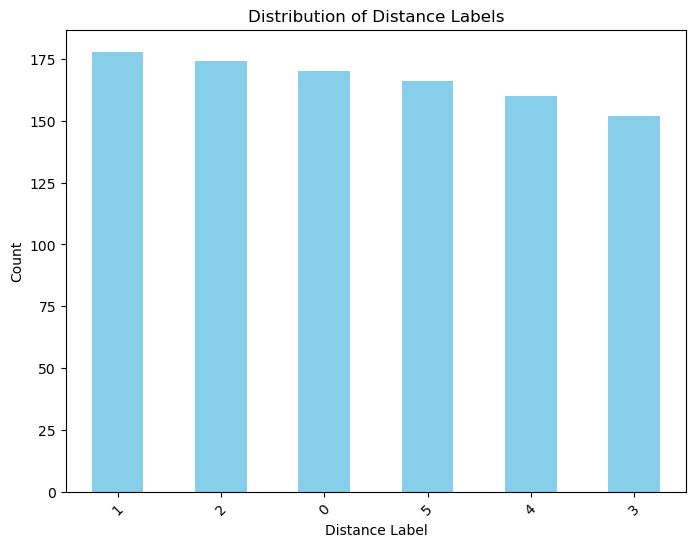

In [12]:
class_counts = dataset['Product line'].value_counts()

# Visualize the distribution
plt.figure(figsize=(8, 6))
class_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Distance Labels')
plt.xlabel('Distance Label')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

In [22]:
import xgboost as xgb

model = xgb.XGBClassifier()
model.fit(x_train, y_train)
predictions = model.predict(x_test)
accuracy = accuracy_score(y_test, predictions)

print("Accuracy:", accuracy)
print("\nClassification Report:")
print(classification_report(y_test, predictions))

Accuracy: 0.17

Classification Report:
              precision    recall  f1-score   support

           0       0.14      0.15      0.14        46
           1       0.29      0.22      0.25        67
           2       0.30      0.24      0.26        55
           3       0.06      0.07      0.07        41
           4       0.13      0.12      0.13        48
           5       0.12      0.16      0.14        43

    accuracy                           0.17       300
   macro avg       0.17      0.16      0.17       300
weighted avg       0.19      0.17      0.18       300

